In [4]:
df.shape

(1032532, 5)

In [8]:
df.head(5)

,Unnamed: 0,id,title,text_embeddings,image_embeddings
0,0,11950591053179551937,La Carrie Faux Fur Headband with Stretch Women...,"[-0.5834972262382507, -0.2571035325527191, 0.0...","[-0.8081451654434204, -0.8063037395477295, 0.5..."
1,1,13060356563414168615,Ugg Women's Shearling Earmuffs - Black,"[-0.13223958015441895, 0.495852530002594, 0.27...","[0.7014051675796509, -1.6714600324630737, 0.56..."
2,2,6741082963333937131,Prettylittlething Women's Cream Soft Faux Fur ...,"[-0.031021088361740112, -0.21627476811408997, ...","[-0.6359163522720337, -1.0776530504226685, -0...."
3,3,8848678524883684053,Prettylittlething Women's Camel Soft Faux Fur ...,"[-0.13749973475933075, 0.5271706581115723, 0.3...","[-1.057648777961731, -0.5335263013839722, 1.01..."
4,4,11334298244441157208,Michael Michael Kors Women's Embellished Faux-...,"[-0.28785184025764465, 0.12776750326156616, 0....","[0.2629774212837219, -0.9749976396560669, 0.24..."


In [12]:
import pandas as pd
df_filtered = pd.read_csv('corpus_2.csv', usecols=['id','title'])

In [7]:
df1.head(5)

,id
0,11950591053179551937
1,13060356563414168615
2,6741082963333937131
3,8848678524883684053
4,11334298244441157208


In [9]:
# Assuming df and df1 are pandas DataFrames and both contain a column named 'id'
# The goal is to delete all rows from df where the 'id' value does not appear in the 'id' column of df1

# Step 1: Identify the 'id' values in df1
ids_in_df1 = df1['id'].unique()

# Step 2: Filter df to keep only the rows where 'id' is in ids_in_df1
df_filtered = df[df['id'].isin(ids_in_df1)]

# df_filtered now contains only the rows from df where 'id' also appears in df1

In [11]:
df_filtered.to_csv('corpus1_embeddings.csv')

In [1]:
import pandas as pd
df_filtered = pd.read_csv('corpus1_embeddings.csv',usecols=["id","title"])

In [2]:
df_filtered

,id,title
0,11950591053179551937,La Carrie Faux Fur Headband with Stretch Women...
1,13060356563414168615,Ugg Women's Shearling Earmuffs - Black
2,6741082963333937131,Prettylittlething Women's Cream Soft Faux Fur ...
3,8848678524883684053,Prettylittlething Women's Camel Soft Faux Fur ...
4,11334298244441157208,Michael Michael Kors Women's Embellished Faux-...
...,...,...
516302,13892348757257813846,Hoka Clifton 9 Shoe - Women's Black / Stellar ...
516303,17536380522411920269,Nike Interact Run Black/Anthracite/White Women...
516304,354775617354732373,"ASICS Women&s EvoRide Running Shoes, 6M, Grey"
516305,10478956154349142528,The North Face Recovery Slip-On Knit II 6.5 Wo...


In [4]:
import torch
import os

checkpoint_dir = './checkpoints2'
all_image_embeddings = []
all_text_embeddings = []
product_ids = []

# Load and aggregate embeddings from all checkpoints
for checkpoint_file in os.listdir(checkpoint_dir):
    if checkpoint_file.endswith('.pt'):
        checkpoint_path = os.path.join(checkpoint_dir, checkpoint_file)
        checkpoint = torch.load(checkpoint_path)
        
        # Aggregate embeddings
        all_image_embeddings.extend(checkpoint['image_embeddings'])
        all_text_embeddings.extend(checkpoint['text_embeddings'])
        product_ids.extend(checkpoint['ids'])

# Concatenate all embeddings into single tensors
image_embeddings = torch.cat(all_image_embeddings, dim=0)
text_embeddings = torch.cat(all_text_embeddings, dim=0)

# Now, `image_embeddings` and `text_embeddings` are in the same format as in your initial code.

C:\Users\Sistem Cerdas Five\AppData\Local\Temp\ipykernel_9592\1524866172.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


In [5]:
from tqdm import tqdm

from itertools import chain
unique_product_ids = []
seen = set()

for sublist in product_ids:
    for item in sublist:
        if item not in seen:
            seen.add(item)
            unique_product_ids.append(item)

len(unique_product_ids)

1032532

In [6]:
grouped_embeddings = []

# Assuming all lists are of the same length
for i in range(len(unique_product_ids)):
    grouped_embeddings.append({
        "image": image_embeddings[i],
        "text": text_embeddings[i],
        "id": unique_product_ids[i]
    })

In [6]:
# import pandas as pd

# # Assuming 'ordered_set' is your set and 'df_filtered' is your DataFrame
# ordered_list = list(unique_product_ids)  # Convert set to list
# id_list = df_filtered['id'].tolist()  # Get the 'id' column as a list

# # Adjust ordered_list if its length is greater than id_list's length
# if len(ordered_list) > len(id_list):
#     ordered_list = ordered_list[:len(id_list)]

# # Check if the orders match
# is_same_order = True
# for i, item in enumerate(ordered_list):
#     if item != id_list[i]:
#         is_same_order = False
#         print(f"Mismatch at position {i}: expected {item}, found {id_list[i]}")
#         break  # Remove this line if you want to find all mismatches.

# print("Is the order the same:", is_same_order)

In [7]:
df_filtered.head

<bound method NDFrame.head of                           id  \
0       11950591053179551937   
1       13060356563414168615   
2        6741082963333937131   
3        8848678524883684053   
4       11334298244441157208   
...                      ...   
516302  13892348757257813846   
516303  17536380522411920269   
516304    354775617354732373   
516305  10478956154349142528   
516306  10595814478990583996   

                                                    title  
0       La Carrie Faux Fur Headband with Stretch Women...  
1                  Ugg Women's Shearling Earmuffs - Black  
2       Prettylittlething Women's Cream Soft Faux Fur ...  
3       Prettylittlething Women's Camel Soft Faux Fur ...  
4       Michael Michael Kors Women's Embellished Faux-...  
...                                                   ...  
516302  Hoka Clifton 9 Shoe - Women's Black / Stellar ...  
516303  Nike Interact Run Black/Anthracite/White Women...  
516304      ASICS Women&s EvoRide Running Sho

In [7]:
# Step 1: Extract the list of valid IDs from the 'id' column of `df_filtered`
valid_ids = set(df_filtered['id'].tolist())

# Step 2: Filter `grouped_embeddings` to only include dictionaries with 'id' in valid_ids
grouped_embeddings_filtered = [d for d in grouped_embeddings if d['id'] in valid_ids]

# Step 3: Create a mapping of ID to its order in the DataFrame
id_order = df_filtered['id'].tolist()
id_to_order = {id: index for index, id in enumerate(id_order)}

# Step 4: Sort the filtered `grouped_embeddings` array using the mapping
grouped_embeddings_sorted = sorted(grouped_embeddings_filtered, key=lambda x: id_to_order[x['id']])

In [10]:
del grouped_embeddings_filtered, valid_ids, id_order, id_to_order, df_filtered, grouped_embeddings, unique_product_ids, seen, image_embeddings, text_embeddings, all_image_embeddings, all_text_embeddings, product_ids, checkpoint

In [9]:
print(df_filtered['id'][0])
print(grouped_embeddings_sorted[0]["id"])

6825713981166174988
6825713981166174988


In [10]:
image_embeddings.shape

torch.Size([1032532, 768])

In [214]:
import pandas as pd

# Load the two CSV files
corpus_1 = pd.read_csv('corpus_1.csv')
corpus_2 = pd.read_csv('corpus_2.csv')

# Stack them on top of each other
sorted_df = pd.concat([corpus_1, corpus_2], ignore_index=True)
del corpus_1, corpus_2

In [289]:
def search_by_keyword(df, keyword):

    return df[df['title'].str.contains(keyword, case=False, na=False)]

# Example usage
keyword = "Aquamarine"  # Replace this with the keyword you're searching for
filtered_df = search_by_keyword(sorted_df, keyword)

# Display the filtered DataFrame
print(filtered_df.shape)
filtered_df

(191, 10)


,id,query,image_local,position,title,pair_id,score_linear,score_reciprocal,no_score,query_id
7992,8272030515270067977,Frame Material,/MarqoData/google_shopping/images/827203051527...,96,Aquamarine Blue Precut Acid-Free Matboard Set ...,Frame Material-8272030515270067977,5,1.041667,1,255
8250,1884842587757153197,Pregnancy swim,/MarqoData/google_shopping/images/188484258775...,89,Dealsswimsuit-promo Kortni Jeane Maternity Bot...,Pregnancy swim-1884842587757153197,12,1.123596,1,3578
10974,2168199104329878174,Colorful Gemstone Stacks,/MarqoData/google_shopping/images/216819910432...,86,"Birthstone Stacking Rings, Wrought 8 / Mar (Aq...",Colorful Gemstone Stacks-2168199104329878174,15,1.162791,1,327
25022,923602137013635548,Cropped Tankinis,/MarqoData/google_shopping/images/923602137013...,20,Coldwater Creek Women's Ruched Tankini -Solid ...,Cropped Tankinis-923602137013635548,81,5.000000,1,705
35183,4488958278815958794,Charm bracelet with gemstones,/MarqoData/google_shopping/images/448895827881...,44,March Birthstone Bracelet - Aquamarine Gemston...,Charm bracelet with gemstones-4488958278815958794,57,2.272727,1,988
...,...,...,...,...,...,...,...,...,...,...
1008487,10340647132167728512,Anklets with Gemstones,/MarqoData/google_shopping/images/103406471321...,6,Women's Gemini Power Healing Stone Bracelet or...,Anklets with Gemstones-10340647132167728512,95,16.666667,1,45250
1010431,3618257303543911806,Grillz with Colored Stones,/MarqoData/google_shopping/images/361825730354...,23,LKV Shark Vampire 14K Gold Plated Grillz Iced ...,Grillz with Colored Stones-3618257303543911806,78,4.347826,1,50449
1010438,13248972874779366997,Grillz with Colored Stones,/MarqoData/google_shopping/images/132489728747...,49,"14"" Aquamarine Vampire Grillz | Men's Grillz -...",Grillz with Colored Stones-13248972874779366997,52,2.040816,1,50449
1018150,6008806567621782903,Matching Eternity Rings Bridal Set,/MarqoData/google_shopping/images/600880656762...,5,2.2 Carat Cushion Cut Aquamarine Bridal Set Di...,Matching Eternity Rings Bridal Set-60088065676...,96,20.000000,1,66544


In [13]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models

## Step 2: Connect to Qdrant and store embeddings
qdrant_client = QdrantClient(host="localhost", port=6333)
# qdrant_client.recreate_collection(
#     collection_name="titles_collection",
#     vectors_config=qdrant_models.VectorParams(size=grouped_embeddings_sorted[0]['image'].shape[0],
#     distance=qdrant_models.Distance.COSINE,
#     multivector_config=qdrant_models.MultiVectorConfig(
#             comparator=qdrant_models.MultiVectorComparator.MAX_SIM
#         ),),
# )

# Preparing points to upload
points = [
    qdrant_models.PointStruct(
        id=grouped_embeddings_sorted[i]['id'],
        vector=[grouped_embeddings_sorted[i]['image'].tolist(), grouped_embeddings_sorted[i]['text'].tolist()],
        payload={'title': df_filtered.iloc[i]['title']}
    )
    for i in tqdm(range(len(grouped_embeddings_sorted)), total=len(grouped_embeddings_sorted))
]

# Step 1: Define the upsert function with retry logic
def upsert_point(point, max_retries=np.inf):
    attempt = 0
    while attempt < max_retries:
        try:
            qdrant_client.upsert(
                collection_name="titles_collection",
                points=[point],  # Note: Upsert expects a list of points
            )
            return True
        except Exception as e:
            attempt += 1
            if attempt == max_retries:
                print(f"Failed to upsert point after {max_retries} attempts.")
    return False

# Step 2: Use ThreadPoolExecutor to parallelize upsert operations
with ThreadPoolExecutor(max_workers=3) as executor:
    # Wrap the executor with tqdm for progress tracking
    results = list(tqdm(executor.map(upsert_point, points), total=len(points)))

# Optional: Check results or handle exceptions
success_count = sum(results)
print(f"Successfully upserted {success_count} out of {len(points)} points.")

100%|██████████| 516225/516225 [1:09:19<00:00, 124.09it/s]


Successfully upserted 516225 out of 516225 points.


In [1]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models
qdrant_client = QdrantClient(host="localhost", port=6333)


In [4]:
import torch
from PIL import Image
import open_clip
from open_clip import tokenize

# Specify the path to your locally downloaded model
model_path = "marqo-gcl-vitl14-124-gs-full_states.pt"

# Load the model and preprocessing transformations
model, _, preprocess = open_clip.create_model_and_transforms('ViT-L-14', pretrained=model_path)
tokenizer = open_clip.get_tokenizer('ViT-L-14')

# Now you can use the model, preprocess, and tokenizer as needed
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

title = ["Baseball Cap"]
inputs = tokenize(title).to(device)
with torch.no_grad():
    query = model.encode_text(inputs).cpu().numpy()

search_results = qdrant_client.query_points(
    collection_name="titles_collection",
     query=[query[0],query[0]],
     limit=18,
)

c:\Users\Sistem Cerdas Five\.conda\envs\lda\lib\site-packages\open_clip\factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path

In [623]:
import time


title = ["jackets"]
inputs = tokenize(title).to(device)
with torch.no_grad():
    query = model.encode_text(inputs).cpu().numpy()

start_time = time.time()
search_results = qdrant_client.query_points(
    collection_name="titles_collection",
    query=[query[0], query[0]],
    limit=18,
)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")
print(search_results.points[0].score)

Elapsed time: 0.054575204849243164 seconds
1.6111535


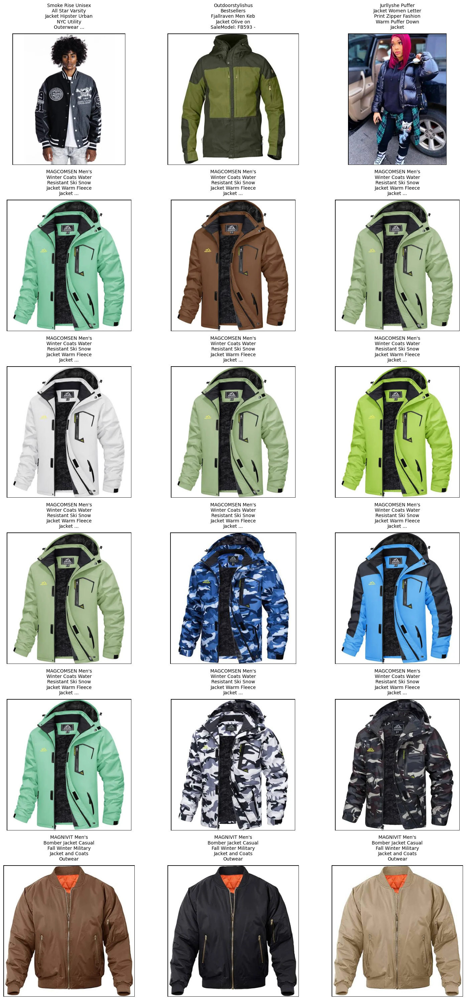

In [624]:
import os
import math
import textwrap
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches

# Assuming QueryResponse and ScoredPoint are defined elsewhere
# from your_module import QueryResponse, ScoredPoint

def display_images(search_results):
    num_images = len(search_results)
    cols = 3  # Number of columns in the grid
    rows = math.ceil(num_images / cols)  # Calculate the number of rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()  # Flatten the 2D array of axes to 1D for easy iteration

    for i, result in enumerate(search_results):
        img_id = result.id
        title = result.payload.get('title', 'No Title')
        img_path = f"./src/images_wfash/{img_id}.webp"

        if os.path.exists(img_path):
            image = Image.open(img_path).convert("RGB")
            axes[i].imshow(image)
            
            # Wrap the title to avoid overlap
            wrapped_title = "\n".join(textwrap.wrap(title, width=20))
            axes[i].set_title(wrapped_title, pad=10, fontsize=10, ha='center')
            axes[i].axis('off')

            # Add a black border around the image and title
            rect = patches.Rectangle((0, 0), 1, 1, transform=axes[i].transAxes,
                                     linewidth=2, edgecolor='black', facecolor='none')
            axes[i].add_patch(rect)
        else:
            print(f"Image {img_path} not found.")
            axes[i].axis('off')  # Hide the axis if the image is not found

    # Hide any remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Display the images and titles
display_images(search_results.points)

In [7]:
import pandas as pd
twt_queries = pd.read_csv('twt_queries.csv')

In [8]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""


In [9]:
import torch
from PIL import Image
import open_clip

# Specify the path to your locally downloaded model
model_path = "marqo-gcl-vitl14-124-gs-full_states.pt"

# Load the model and preprocessing transformations
model, _, preprocess = open_clip.create_model_and_transforms('ViT-L-14', pretrained=model_path)
tokenizer = open_clip.get_tokenizer('ViT-L-14')

# Now you can use the model, preprocess, and tokenizer as needed
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)


c:\Users\Sistem Cerdas Five\.conda\envs\lda\lib\site-packages\open_clip\factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-23): 24 x ResidualAttentionBlock(
          (ln_1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=1024, out_features=4096, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=4096, out_features=1024, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((1024,), eps=1e-05, elementwi

In [10]:
twt_queries["product"]=twt_queries["product"].astype(str)
twt_queries["image_url"]=twt_queries["image_url"].astype(str)

In [662]:
import pandas as pd
df_product=pd.read_csv("twend.csv")

In [665]:
import pandas as pd
import re

# Convert all specified columns to strings
columns_to_clean = ['core_product_type', 'modifier', 'creator', 'department', 'occasion', 'color', 'material', 'product_name', 'content', 'origin', 'UoM', 'time', 'condition', 'quantity', 'shape', 'product_number', 'price']
df_product[columns_to_clean] = df_product[columns_to_clean].astype(str)

# Function to clean each value in the dataframe
def clean_text(text):
    # Delete all special characters and punctuations
    text = re.sub(r'[^\w\s]', '', text)
    # Delete all trailing and leading spaces and any spaces that are more than one
    text = re.sub(r'\s+', ' ', text).strip()
    return text

# Apply the cleaning function to each column
for column in columns_to_clean:
    df_product[column] = df_product[column].apply(clean_text)

In [ ]:
import pandas as pd
df_filtered = pd.read_csv('corpus_2.csv', usecols=['id','title'])

In [ ]:
df1.head(5)

,id
0,11950591053179551937
1,13060356563414168615
2,6741082963333937131
3,8848678524883684053
4,11334298244441157208


In [ ]:
# Assuming df and df1 are pandas DataFrames and both contain a column named 'id'
# The goal is to delete all rows from df where the 'id' value does not appear in the 'id' column of df1

# Step 1: Identify the 'id' values in df1
ids_in_df1 = df1['id'].unique()

# Step 2: Filter df to keep only the rows where 'id' is in ids_in_df1
df_filtered = df[df['id'].isin(ids_in_df1)]

# df_filtered now contains only the rows from df where 'id' also appears in df1

In [ ]:
df_filtered.to_csv('corpus1_embeddings.csv')

In [ ]:
import pandas as pd
df_filtered = pd.read_csv('corpus1_embeddings.csv',usecols=["id","title"])

In [ ]:
df_filtered

,id,title
0,11950591053179551937,La Carrie Faux Fur Headband with Stretch Women...
1,13060356563414168615,Ugg Women's Shearling Earmuffs - Black
2,6741082963333937131,Prettylittlething Women's Cream Soft Faux Fur ...
3,8848678524883684053,Prettylittlething Women's Camel Soft Faux Fur ...
4,11334298244441157208,Michael Michael Kors Women's Embellished Faux-...
...,...,...
516302,13892348757257813846,Hoka Clifton 9 Shoe - Women's Black / Stellar ...
516303,17536380522411920269,Nike Interact Run Black/Anthracite/White Women...
516304,354775617354732373,"ASICS Women&s EvoRide Running Shoes, 6M, Grey"
516305,10478956154349142528,The North Face Recovery Slip-On Knit II 6.5 Wo...


In [ ]:
import torch
import os

checkpoint_dir = './checkpoints2'
all_image_embeddings = []
all_text_embeddings = []
product_ids = []

# Load and aggregate embeddings from all checkpoints
for checkpoint_file in os.listdir(checkpoint_dir):
    if checkpoint_file.endswith('.pt'):
        checkpoint_path = os.path.join(checkpoint_dir, checkpoint_file)
        checkpoint = torch.load(checkpoint_path)
        
        # Aggregate embeddings
        all_image_embeddings.extend(checkpoint['image_embeddings'])
        all_text_embeddings.extend(checkpoint['text_embeddings'])
        product_ids.extend(checkpoint['ids'])

# Concatenate all embeddings into single tensors
image_embeddings = torch.cat(all_image_embeddings, dim=0)
text_embeddings = torch.cat(all_text_embeddings, dim=0)

# Now, `image_embeddings` and `text_embeddings` are in the same format as in your initial code.

C:\Users\Sistem Cerdas Five\AppData\Local\Temp\ipykernel_9592\1524866172.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


In [ ]:
from tqdm import tqdm

from itertools import chain
unique_product_ids = []
seen = set()

for sublist in product_ids:
    for item in sublist:
        if item not in seen:
            seen.add(item)
            unique_product_ids.append(item)

len(unique_product_ids)

1032532

In [ ]:
grouped_embeddings = []

# Assuming all lists are of the same length
for i in range(len(unique_product_ids)):
    grouped_embeddings.append({
        "image": image_embeddings[i],
        "text": text_embeddings[i],
        "id": unique_product_ids[i]
    })

In [ ]:
# import pandas as pd

# # Assuming 'ordered_set' is your set and 'df_filtered' is your DataFrame
# ordered_list = list(unique_product_ids)  # Convert set to list
# id_list = df_filtered['id'].tolist()  # Get the 'id' column as a list

# # Adjust ordered_list if its length is greater than id_list's length
# if len(ordered_list) > len(id_list):
#     ordered_list = ordered_list[:len(id_list)]

# # Check if the orders match
# is_same_order = True
# for i, item in enumerate(ordered_list):
#     if item != id_list[i]:
#         is_same_order = False
#         print(f"Mismatch at position {i}: expected {item}, found {id_list[i]}")
#         break  # Remove this line if you want to find all mismatches.

# print("Is the order the same:", is_same_order)

In [ ]:
df_filtered.head

<bound method NDFrame.head of                           id  \
0       11950591053179551937   
1       13060356563414168615   
2        6741082963333937131   
3        8848678524883684053   
4       11334298244441157208   
...                      ...   
516302  13892348757257813846   
516303  17536380522411920269   
516304    354775617354732373   
516305  10478956154349142528   
516306  10595814478990583996   

                                                    title  
0       La Carrie Faux Fur Headband with Stretch Women...  
1                  Ugg Women's Shearling Earmuffs - Black  
2       Prettylittlething Women's Cream Soft Faux Fur ...  
3       Prettylittlething Women's Camel Soft Faux Fur ...  
4       Michael Michael Kors Women's Embellished Faux-...  
...                                                   ...  
516302  Hoka Clifton 9 Shoe - Women's Black / Stellar ...  
516303  Nike Interact Run Black/Anthracite/White Women...  
516304      ASICS Women&s EvoRide Running Sho

In [ ]:
# Step 1: Extract the list of valid IDs from the 'id' column of `df_filtered`
valid_ids = set(df_filtered['id'].tolist())

# Step 2: Filter `grouped_embeddings` to only include dictionaries with 'id' in valid_ids
grouped_embeddings_filtered = [d for d in grouped_embeddings if d['id'] in valid_ids]

# Step 3: Create a mapping of ID to its order in the DataFrame
id_order = df_filtered['id'].tolist()
id_to_order = {id: index for index, id in enumerate(id_order)}

# Step 4: Sort the filtered `grouped_embeddings` array using the mapping
grouped_embeddings_sorted = sorted(grouped_embeddings_filtered, key=lambda x: id_to_order[x['id']])

In [ ]:
del grouped_embeddings_filtered, valid_ids, id_order, id_to_order, df_filtered, grouped_embeddings, unique_product_ids, seen, image_embeddings, text_embeddings, all_image_embeddings, all_text_embeddings, product_ids, checkpoint

In [ ]:
print(df_filtered['id'][0])
print(grouped_embeddings_sorted[0]["id"])

6825713981166174988
6825713981166174988


In [ ]:
image_embeddings.shape

torch.Size([1032532, 768])

In [ ]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models

## Step 2: Connect to Qdrant and store embeddings
qdrant_client = QdrantClient(host="localhost", port=6333)
# qdrant_client.recreate_collection(
#     collection_name="titles_collection",
#     vectors_config=qdrant_models.VectorParams(size=grouped_embeddings_sorted[0]['image'].shape[0],
#     distance=qdrant_models.Distance.COSINE,
#     multivector_config=qdrant_models.MultiVectorConfig(
#             comparator=qdrant_models.MultiVectorComparator.MAX_SIM
#         ),),
# )

# Preparing points to upload
points = [
    qdrant_models.PointStruct(
        id=grouped_embeddings_sorted[i]['id'],
        vector=[grouped_embeddings_sorted[i]['image'].tolist(), grouped_embeddings_sorted[i]['text'].tolist()],
        payload={'title': df_filtered.iloc[i]['title']}
    )
    for i in tqdm(range(len(grouped_embeddings_sorted)), total=len(grouped_embeddings_sorted))
]

# Step 1: Define the upsert function with retry logic
def upsert_point(point, max_retries=np.inf):
    attempt = 0
    while attempt < max_retries:
        try:
            qdrant_client.upsert(
                collection_name="titles_collection",
                points=[point],  # Note: Upsert expects a list of points
            )
            return True
        except Exception as e:
            attempt += 1
            if attempt == max_retries:
                print(f"Failed to upsert point after {max_retries} attempts.")
    return False

# Step 2: Use ThreadPoolExecutor to parallelize upsert operations
with ThreadPoolExecutor(max_workers=3) as executor:
    # Wrap the executor with tqdm for progress tracking
    results = list(tqdm(executor.map(upsert_point, points), total=len(points)))

# Optional: Check results or handle exceptions
success_count = sum(results)
print(f"Successfully upserted {success_count} out of {len(points)} points.")

100%|██████████| 516225/516225 [1:09:19<00:00, 124.09it/s]


Successfully upserted 516225 out of 516225 points.


In [ ]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models
qdrant_client = QdrantClient(host="localhost", port=6333)


In [ ]:
import torch
from PIL import Image
import open_clip
from open_clip import tokenize

# Specify the path to your locally downloaded model
model_path = "marqo-gcl-vitl14-124-gs-full_states.pt"

# Load the model and preprocessing transformations
model, _, preprocess = open_clip.create_model_and_transforms('ViT-L-14', pretrained=model_path)
tokenizer = open_clip.get_tokenizer('ViT-L-14')

# Now you can use the model, preprocess, and tokenizer as needed
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

title = ["Baseball Cap"]
inputs = tokenize(title).to(device)
with torch.no_grad():
    query = model.encode_text(inputs).cpu().numpy()

search_results = qdrant_client.query_points(
    collection_name="titles_collection",
     query=[query[0],query[0]],
     limit=18,
)

c:\Users\Sistem Cerdas Five\.conda\envs\lda\lib\site-packages\open_clip\factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path

In [ ]:
import time


title = ["jackets"]
inputs = tokenize(title).to(device)
with torch.no_grad():
    query = model.encode_text(inputs).cpu().numpy()

start_time = time.time()
search_results = qdrant_client.query_points(
    collection_name="titles_collection",
    query=[query[0], query[0]],
    limit=18,
)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time} seconds")
print(search_results.points[0].score)

Elapsed time: 0.054575204849243164 seconds
1.6111535


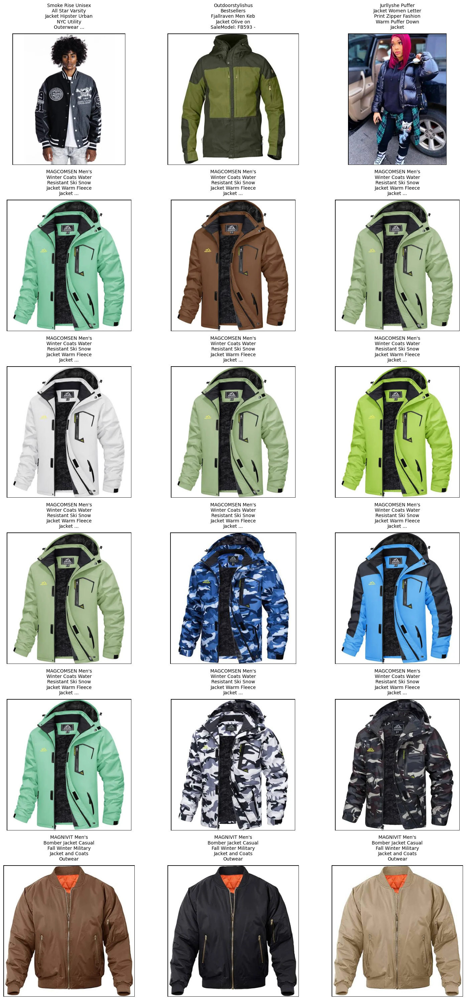

In [ ]:
import os
import math
import textwrap
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches

# Assuming QueryResponse and ScoredPoint are defined elsewhere
# from your_module import QueryResponse, ScoredPoint

def display_images(search_results):
    num_images = len(search_results)
    cols = 3  # Number of columns in the grid
    rows = math.ceil(num_images / cols)  # Calculate the number of rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()  # Flatten the 2D array of axes to 1D for easy iteration

    for i, result in enumerate(search_results):
        img_id = result.id
        title = result.payload.get('title', 'No Title')
        img_path = f"./src/images_wfash/{img_id}.webp"

        if os.path.exists(img_path):
            image = Image.open(img_path).convert("RGB")
            axes[i].imshow(image)
            
            # Wrap the title to avoid overlap
            wrapped_title = "\n".join(textwrap.wrap(title, width=20))
            axes[i].set_title(wrapped_title, pad=10, fontsize=10, ha='center')
            axes[i].axis('off')

            # Add a black border around the image and title
            rect = patches.Rectangle((0, 0), 1, 1, transform=axes[i].transAxes,
                                     linewidth=2, edgecolor='black', facecolor='none')
            axes[i].add_patch(rect)
        else:
            print(f"Image {img_path} not found.")
            axes[i].axis('off')  # Hide the axis if the image is not found

    # Hide any remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Display the images and titles
display_images(search_results.points)

In [ ]:
import pandas as pd
twt_queries = pd.read_csv('twt_queries.csv')

In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""


In [ ]:
import torch
from PIL import Image
import open_clip

# Specify the path to your locally downloaded model
model_path = "marqo-gcl-vitl14-124-gs-full_states.pt"

# Load the model and preprocessing transformations
model, _, preprocess = open_clip.create_model_and_transforms('ViT-L-14', pretrained=model_path)
tokenizer = open_clip.get_tokenizer('ViT-L-14')

# Now you can use the model, preprocess, and tokenizer as needed
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)


c:\Users\Sistem Cerdas Five\.conda\envs\lda\lib\site-packages\open_clip\factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-23): 24 x ResidualAttentionBlock(
          (ln_1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=1024, out_features=4096, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=4096, out_features=1024, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((1024,), eps=1e-05, elementwi

In [ ]:
twt_queries["product"]=twt_queries["product"].astype(str)
twt_queries["image_url"]=twt_queries["image_url"].astype(str)

In [ ]:
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import torch
from open_clip import tokenize
from tqdm import tqdm  # Step 1: Import tqdm

# Assuming 'df' is your DataFrame, 'model' is your embedding model, and 'tokenizer' preprocesses your text
# Also assuming 'device' is defined (e.g., 'cuda' or 'cpu')

# Initialize lists to hold embeddings
image_embeddings = []
text_embeddings = []

for index, row in tqdm(twt_queries.iterrows(), total=twt_queries.shape[0]):
    # Check if product_text is NaN or empty; if so, use "miscellaneous" as a fallback
    product_text = row['product']
    if pd.isna(product_text) or product_text == "":
        product_text = "miscellaneous"
    
    text_input = tokenize([product_text]).to(device)
    with torch.no_grad():
        text_embed = model.encode_text(text_input).float()
    
    # Initialize image_embed to None for later check
    image_embed = None
    
    # Check if image URL is NaN or not
    if not pd.isna(row['image_url']):
        try:
            response = requests.get(row['image_url'])
            image = Image.open(BytesIO(response.content)).convert("RGB")
            image = preprocess(image)  # Assuming 'preprocess' is defined
            image_input = torch.stack([image]).to(device)
            with torch.no_grad():
                image_embed = model.encode_image(image_input).float()
        except Exception as e:
            print(f"Error processing image for row {index}: {e}")
    
    # If image embedding failed or image URL was NaN, use text embedding as image embedding
    if image_embed is None:
        image_embed = text_embed.clone()
    
    # Append embeddings to lists
    image_embeddings.append(image_embed)
    text_embeddings.append(text_embed)

  0%|          | 0/4857 [00:00<?, ?it/s]c:\Users\Sistem Cerdas Five\.conda\envs\lda\lib\site-packages\torch\nn\functional.py:5560: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  attn_output = scaled_dot_product_attention(q, k, v, attn_mask, dropout_p, is_causal)
  1%|          | 46/4857 [00:29<17:51,  4.49it/s]  

Error processing image for row 41: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 42: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 43: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 44: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 45: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 11%|█         | 529/4857 [06:26<38:24,  1.88it/s]  

Error processing image for row 528: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 529: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 530: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 531: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 21%|██        | 1010/4857 [12:10<48:36,  1.32it/s] 

Error processing image for row 1010: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1011: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1012: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 35%|███▍      | 1697/4857 [20:47<23:58,  2.20it/s]  

Error processing image for row 1695: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1696: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1697: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1698: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1699: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1700: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 38%|███▊      | 1843/4857 [21:59<13:27,  3.73it/s]

Error processing image for row 1842: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1843: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1844: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1845: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 47%|████▋     | 2303/4857 [25:08<11:09,  3.82it/s]

Error processing image for row 2302: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2303: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2304: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2305: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2306: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 49%|████▊     | 2356/4857 [25:22<10:53,  3.83it/s]

Error processing image for row 2356: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2357: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2358: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2359: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2360: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 53%|█████▎    | 2553/4857 [26:20<04:07,  9.32it/s]

Error processing image for row 2548: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2549: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2550: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2551: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 55%|█████▍    | 2659/4857 [27:50<25:29,  1.44it/s]

Error processing image for row 2658: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2659: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2660: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 56%|█████▋    | 2734/4857 [28:52<21:40,  1.63it/s]

Error processing image for row 2733: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2734: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2735: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2736: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2737: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 57%|█████▋    | 2770/4857 [29:18<15:32,  2.24it/s]

Error processing image for row 2768: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2769: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2770: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2771: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2772: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 68%|██████▊   | 3307/4857 [36:48<32:16,  1.25s/it]  

Error processing image for row 3307: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3308: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3309: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 73%|███████▎  | 3535/4857 [40:25<19:30,  1.13it/s]

Error processing image for row 3534: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3535: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3536: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3537: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3538: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3539: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3540: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3541: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3542: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3543: 

 74%|███████▍  | 3606/4857 [41:17<12:28,  1.67it/s]

Error processing image for row 3604: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3605: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3606: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3607: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3608: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 90%|████████▉ | 4363/4857 [48:28<02:03,  3.99it/s]

Error processing image for row 4362: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4363: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4364: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 94%|█████████▍| 4559/4857 [49:40<01:26,  3.46it/s]

Error processing image for row 4558: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4559: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4560: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 94%|█████████▍| 4587/4857 [49:51<01:28,  3.04it/s]

Error processing image for row 4586: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4587: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4588: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4589: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4590: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 96%|█████████▌| 4644/4857 [50:13<00:50,  4.21it/s]

Error processing image for row 4642: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4643: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4644: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4645: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 96%|█████████▌| 4662/4857 [50:18<00:24,  7.96it/s]

Error processing image for row 4658: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4659: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4660: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4661: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4662: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 98%|█████████▊| 4740/4857 [50:50<00:14,  8.35it/s]

Error processing image for row 4734: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4735: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4736: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4737: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4738: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4739: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4740: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4741: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4742: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4743: 

 98%|█████████▊| 4772/4857 [51:01<00:19,  4.40it/s]

Error processing image for row 4772: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4773: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4774: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4775: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4776: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 99%|█████████▉| 4820/4857 [51:17<00:04,  8.66it/s]

Error processing image for row 4814: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4815: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4816: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4817: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4818: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4819: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4820: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4821: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4822: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4823: 

100%|█████████▉| 4844/4857 [51:26<00:04,  2.85it/s]

Error processing image for row 4843: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4844: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4845: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4846: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4847: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


100%|██████████| 4857/4857 [51:34<00:00,  1.57it/s]


In [ ]:
# Save the embeddings to disk
torch.save(image_embeddings, 'image_embeddings_twt.pt')
torch.save(text_embeddings, 'text_embeddings_twt.pt')

In [ ]:
import torch

# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print(f"CUDA available: {cuda_available}")

# If CUDA is available, set the default tensor type to use CUDA, otherwise use CPU
device = torch.device("cuda" if cuda_available else "cpu")
print(f"Using device: {device}")

# Example of using the device
# tensor = torch.tensor([1.0, 2.0, 3.0], device=device)
# This will create a tensor on the GPU if CUDA is available, otherwise on the CPU

CUDA available: True
Using device: cuda


In [ ]:
# Assuming twt_queries is already loaded as a DataFrame
twt_queries = pd.read_csv('twt_queries.csv') # Uncomment and modify with actual path if needed
twt_queries["id_str"] = twt_queries['id_str'].astype('Int64')
twt_queries["product"] = twt_queries['product'].astype(str)

In [ ]:
twt_queries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4857 entries, 0 to 4856
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_str                   4857 non-null   Int64  
 1   index                    4857 non-null   int64  
 2   product                  4857 non-null   object 
 3   created_at               4857 non-null   object 
 4   favorite_count           4857 non-null   float64
 5   full_text                4857 non-null   object 
 6   image_url                4738 non-null   object 
 7   in_reply_to_screen_name  0 non-null      float64
 8   lang                     4857 non-null   object 
 9   location                 3444 non-null   object 
 10  quote_count              4857 non-null   float64
 11  reply_count              4857 non-null   float64
 12  retweet_count            4857 non-null   float64
 13  tweet_url                4857 non-null   object 
 14  user_id_str             

In [ ]:
import pandas as pd
import torch
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models
import numpy as np

text_embeddings_twt = torch.load('image_embeddings_google_products.pt', map_location='cpu')

# Initialize Qdrant client
qdrant_client = QdrantClient(host="localhost", port=6333)
qdrant_client.recreate_collection(
    collection_name="trending_collection",
    vectors_config=qdrant_models.VectorParams(
        size=len(text_embeddings_twt[0]),  # Assuming the second dimension is the size of the embedding
        distance=qdrant_models.Distance.COSINE,
        multivector_config=qdrant_models.MultiVectorConfig(
            comparator=qdrant_models.MultiVectorComparator.MAX_SIM
        ),
    ),
)

# Prepare points to upload
points = [
    qdrant_models.PointStruct(
        id=row['id_str'],
        # Concatenate image and text embeddings into a single flat list
        vector=[text_embeddings_twt[i].tolist() , text_embeddings_twt[i].tolist()],
        payload={'product': row['product']}
    )
    for i, row in tqdm(twt_queries.iterrows(), total=twt_queries.shape[0])
]

# Define the upsert function with retry logic
def upsert_point(point, max_retries=np.inf):
    attempt = 0
    while attempt < max_retries:
        try:
            qdrant_client.upsert(
                collection_name="trending_collection",
                points=[point],
            )
            return True
        except Exception as e:
            print(f"Attempt {attempt + 1}: Failed to upsert point due to: {e}")
            attempt += 1
            if attempt == max_retries:
                print(f"Failed to upsert point after {max_retries} attempts.")
    return False

# Use ThreadPoolExecutor to parallelize upsert operations
with ThreadPoolExecutor(max_workers=3) as executor:
    # Wrap the executor with tqdm for progress tracking
    results = list(tqdm(executor.map(upsert_point, points), total=len(points)))

# Optional: Check results or handle exceptions
success_count = sum(results)
print(f"Successfully upserted {success_count} out of {len(points)} points.")

ValueError: invalid literal for int() with base 10: '#TheMillionaireLife #MillionaireMatch #elegantstyle #styleoftheday #elegance #fashionstyle #dailystyle https://t.co/NrJbxooNad'

In [ ]:
import numpy as np
from tqdm import tqdm

def dcg_at_k(r, k):
    r = np.asfarray(r)[:k]
    if r.size:
        return np.sum(r / np.log2(np.arange(2, r.size + 2)))
    return 0.

def ndcg_at_k(r, k):
    dcg_max = dcg_at_k(sorted(r, reverse=True), k)
    if not dcg_max:
        return 0.
    return dcg_at_k(r, k) / dcg_max

def calculate_ndcg(sorted_df, results_df):
    queries = sorted_df['query_id'].unique()
    ndcg_scores = []

    for query in tqdm(queries, desc="Calculating nDCG", unit="query"):
        ideal_ranking = sorted_df[sorted_df['query_id'] == query].sort_values('position')['product_id'].tolist()
        predicted_ranking = results_df[results_df['query_id'] == query].sort_values('position')['product_id'].tolist()
        
        # Create relevance scores
        ideal_relevance = [1 if product in predicted_ranking else 0 for product in ideal_ranking]
        predicted_relevance = [1 if product in ideal_ranking else 0 for product in predicted_ranking]
        
        # Calculate nDCG
        k = len(ideal_ranking)
        ndcg = ndcg_at_k(predicted_relevance, k)
        ndcg_scores.append(ndcg)
    
    # Compute average nDCG
    average_ndcg = np.mean(ndcg_scores)
    return average_ndcg

# Example usage (ensure sorted_df and results_df are defined)
average_ndcg = calculate_ndcg(sorted_df, results_df)
print(f'Average nDCG: {average_ndcg}')

Calculating nDCG: 100%|██████████| 15012/15012 [00:43<00:00, 341.30query/s]

Average nDCG: 0.7826030555055751


In [634]:

# df_product['product']=df_product['product'].astype(str)
# df_product['index']=df_product['index'].astype('int64')

# Ensure both columns are of string type
df_product['core_product_type_string'] = df_product['core_product_type_string'].astype(str)
df_product['attribute'] = df_product['attribute'].astype(str)

# Combine the columns into a new column named "product"
df_product['product'] = df_product['core_product_type_string'] + df_product['attribute']

In [635]:
# Sample DataFrame creation for demonstration
# df_product = pd.DataFrame({'product': ['product-1', ' product- 2', 'product - 3 ', 'product-1']})

# Step 1: Remove all "-" characters
df_product['product'] = df_product['product'].str.replace('-', '', regex=False)

# Step 2: Remove spaces at the start and end of strings
df_product['product'] = df_product['product'].str.strip()

# Step 3: Remove spaces that are 2 or more in a row
df_product['product'] = df_product['product'].str.replace(r'\s{2,}', ' ', regex=True)

# Step 4: Create a list of all unique strings within the column
unique_products = df_product['product'].unique().tolist()

# Result
# Step 1: Remove all occurrences of the word "women" and ensure extra spaces are deleted
unique_products = [' '.join(word for word in product.split() if word.lower() != 'women').strip() for product in unique_products]

# Step 2: Delete all elements where there is just one word inside the string
unique_products = [product for product in unique_products if len(product.split()) > 1]

# Remove duplicates while preserving order
unique_products = list(dict.fromkeys(unique_products))



In [642]:
# Step 1: Define the function to process the list of strings
def process_unique_history(unique_history):
    processed_history = []
    
    for item in unique_history:
        # Step 2: Remove duplicate words in each string
        words_seen = set()
        new_words = []
        for word in item.split():
            if word not in words_seen:
                new_words.append(word)
                words_seen.add(word)
        
        # Step 3: Join the words back into a string and strip extra spaces
        new_item = " ".join(new_words).strip()
        
        # Step 4: Add the processed string to the list if it has two or more words
        if len(new_words) >= 2:
            processed_history.append(new_item)
    
    return processed_history

# Example usage
processed_history = process_unique_history(unique_products)
print(processed_history)

['magazines fashion', 'accessories fashion', 'outfit fashion', 'book fashion', 'clothing fashion', 'prints fashion', 'outfits fashion', 'hats fashion', 'merchandise fashion', 'hair accessories', 'course fashion', 'spinner wheel fashion', 'items fashion', 'nail stickers fashion', 'sunglasses fashion', 'camera accessories', 'backdrop fashion', 'apparel fashion', 'tickets fashion', 'hair accessories )', 'jewelry necklaces earrings fashion', 'sandals fashion', 'banana accessories', 'books fashion', 'props fashion', 'jacket fashion', 'dress fashion', 'courses fashion', 'jewelry fashion', 'earrings fashion', 'robe fashion', 'dresses fashion', 'services fashion', 'photography fashion', 'lookbooks fashion', 'pack services fashion', 'heels fashion', 'tights fashion', 'tees fashion', 'swim accessories', 'game merchandise fashion', 'saree fashion accessories', 'pieces fashion', 'cardigan fashion', 'saree draping accessories', 'swimwear fashion', 'swimwear accessories', 'memorabilia fashion', 'swi

In [558]:
inputs = tokenizer.tokenize(unique_products).to(device)
with torch.no_grad():
    text_embeddings = model.encode_text(inputs).float()

In [548]:
torch.save(text_embeddings, 'text_embeddings_query_history.pt')

In [564]:
len(unique_products)

1574

In [571]:
from tqdm import tqdm  # Step 1: Import tqdm

# Adjusted code for using `unique_products` and `text_embeddings` only

# Assuming `unique_products` is a list of strings and `text_embeddings` is a list of embeddings
points = [
    qdrant_models.PointStruct(
        id=1000 + index,  # Starting ID from 1000
        vector=[text_embedding.tolist(), text_embedding.tolist()],  # Only using text_embedding
        payload={'product': title}  # Using title from `unique_products`
    )
    for index, (title, text_embedding) in tqdm(enumerate(zip(unique_products, text_embeddings)), desc="Generating points")
]

Generating points: 1574it [00:00, 7756.56it/s]


In [572]:
from tqdm import tqdm

# Function to split a list into chunks
def split_into_chunks(lst, chunk_size):
    """Yield successive chunk_size chunks from lst."""
    for i in range(0, len(lst), chunk_size):
        yield lst[i:i + chunk_size]

# Assuming the rest of your code is above this

# Define chunk size (experiment to find the optimal size, here we use 1000 as an example)
chunk_size = 1000

# Split points into chunks
points_chunks = list(split_into_chunks(points, chunk_size))

# Upload each chunk to Qdrant
for chunk in tqdm(points_chunks, desc="Uploading chunks"):
    qdrant_client.upsert(
        collection_name="trending_collection",
        points=chunk,
    )

Uploading chunks: 100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


In [633]:
# Correcting the NameError by using the correct module name `qdrant_models` instead of `models`

from qdrant_client import QdrantClient, models as qdrant_models
# Assuming `points` is the list of PointStruct objects you've created

# Extracting IDs from the `points` list
ids = [point.id for point in points]

# Now `ids` contains all the IDs you generated

qdrant_client.delete(
    collection_name="trending_collection",
    points_selector=qdrant_models.PointIdsList(
        points=ids,
    ),
)

UpdateResult(operation_id=578, status=<UpdateStatus.COMPLETED: 'completed'>)

In [503]:
# import pandas as pd
# df_product=pd.read_csv("twtrend.csv")
# # df_product['product']=df_product['product'].astype(str)
# # df_product['index']=df_product['index'].astype('int64')

# # Ensure both columns are of string type
# df_product['core_product_type_string'] = df_product['core_product_type_string'].astype(str)
# df_product['attribute'] = df_product['attribute'].astype(str)

# # Combine the columns into a new column named "product"
# df_product['product'] = df_product['core_product_type_string'] + df_product['attribute']

In [96]:
import pandas as pd
df_product=pd.read_csv("df_product.csv")
df_product['product']=df_product['product'].astype(str)
df_product['index']=df_product['index'].astype('int64')

In [107]:
import pandas as pd
from tqdm import tqdm  # Step 1: Import tqdm
import torch
from open_clip import tokenize

# Assuming 'df_product' is your DataFrame and 'model' is your embedding model
# Also assuming 'device' is defined (e.g., 'cuda' or 'cpu')

# Initialize list to hold text embeddings
text_embeddings = []

for index, row in tqdm(df_product.iterrows(), total=df_product.shape[0]):
    # Check if product_text is NaN or empty; if so, use "miscellaneous" as a fallback
    product_text = row['product']
    if pd.isna(product_text) or product_text == "":
        product_text = "miscellaneous"
    
    text_input = tokenize([product_text]).to(device)
    with torch.no_grad():
        text_embed = model.encode_text(text_input).float()
    
    # Append embeddings to list
    text_embeddings.append(text_embed)
text_embeddings = torch.cat(text_embeddings,dim=0)


































100%|██████████| 574/574 [00:03<00:00, 164.84it/s]


In [108]:
torch.save(text_embeddings, 'image_embeddings_google_products.pt')

In [109]:
import pandas as pd
import torch
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models
import numpy as np

text_embeddings_twt = torch.load('image_embeddings_google_products.pt', map_location='cpu')


# Prepare points to upload
points = [
    qdrant_models.PointStruct(
        id=row['index'],
        # Concatenate image and text embeddings into a single flat list
        vector=[text_embeddings_twt[i].tolist() , text_embeddings_twt[i].tolist()],
        payload={'product': row['product']}
    )
    for i, row in tqdm(df_product.iterrows(), total=df_product.shape[0])
]

# Define the upsert function with retry logic
def upsert_point(point, max_retries=np.inf):
    attempt = 0
    while attempt < max_retries:
        try:
            qdrant_client.upsert(
                collection_name="trending_collection",
                points=[point],
            )
            return True
        except Exception as e:
            print(f"Attempt {attempt + 1}: Failed to upsert point due to: {e}")
            attempt += 1
            if attempt == max_retries:
                print(f"Failed to upsert point after {max_retries} attempts.")
    return False

# Use ThreadPoolExecutor to parallelize upsert operations
with ThreadPoolExecutor(max_workers=3) as executor:
    # Wrap the executor with tqdm for progress tracking
    results = list(tqdm(executor.map(upsert_point, points), total=len(points)))

# Optional: Check results or handle exceptions
success_count = sum(results)
print(f"Successfully upserted {success_count} out of {len(points)} points.")

C:\Users\Sistem Cerdas Five\AppData\Local\Temp\ipykernel_16768\490352098.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  text_embeddings_twt = torch.load('image_embeddin

Successfully upserted 574 out of 574 points.


In [ ]:
import torch

# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print(f"CUDA available: {cuda_available}")

# If CUDA is available, set the default tensor type to use CUDA, otherwise use CPU
device = torch.device("cuda" if cuda_available else "cpu")
print(f"Using device: {device}")

# Example of using the device
# tensor = torch.tensor([1.0, 2.0, 3.0], device=device)
# This will create a tensor on the GPU if CUDA is available, otherwise on the CPU

In [12]:
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import torch
from open_clip import tokenize
from tqdm import tqdm  # Step 1: Import tqdm

# Assuming 'df' is your DataFrame, 'model' is your embedding model, and 'tokenizer' preprocesses your text
# Also assuming 'device' is defined (e.g., 'cuda' or 'cpu')

# Initialize lists to hold embeddings
image_embeddings = []
text_embeddings = []

for index, row in tqdm(twt_queries.iterrows(), total=twt_queries.shape[0]):
    # Check if product_text is NaN or empty; if so, use "miscellaneous" as a fallback
    product_text = row['product']
    if pd.isna(product_text) or product_text == "":
        product_text = "miscellaneous"
    
    text_input = tokenize([product_text]).to(device)
    with torch.no_grad():
        text_embed = model.encode_text(text_input).float()
    
    # Initialize image_embed to None for later check
    image_embed = None
    
    # Check if image URL is NaN or not
    if not pd.isna(row['image_url']):
        try:
            response = requests.get(row['image_url'])
            image = Image.open(BytesIO(response.content)).convert("RGB")
            image = preprocess(image)  # Assuming 'preprocess' is defined
            image_input = torch.stack([image]).to(device)
            with torch.no_grad():
                image_embed = model.encode_image(image_input).float()
        except Exception as e:
            print(f"Error processing image for row {index}: {e}")
    
    # If image embedding failed or image URL was NaN, use text embedding as image embedding
    if image_embed is None:
        image_embed = text_embed.clone()
    
    # Append embeddings to lists
    image_embeddings.append(image_embed)
    text_embeddings.append(text_embed)

  0%|          | 0/4857 [00:00<?, ?it/s]c:\Users\Sistem Cerdas Five\.conda\envs\lda\lib\site-packages\torch\nn\functional.py:5560: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  attn_output = scaled_dot_product_attention(q, k, v, attn_mask, dropout_p, is_causal)
  1%|          | 46/4857 [00:29<17:51,  4.49it/s]  

Error processing image for row 41: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 42: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 43: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 44: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 45: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 11%|█         | 529/4857 [06:26<38:24,  1.88it/s]  

Error processing image for row 528: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 529: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 530: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 531: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 21%|██        | 1010/4857 [12:10<48:36,  1.32it/s] 

Error processing image for row 1010: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1011: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1012: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 35%|███▍      | 1697/4857 [20:47<23:58,  2.20it/s]  

Error processing image for row 1695: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1696: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1697: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1698: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1699: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1700: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 38%|███▊      | 1843/4857 [21:59<13:27,  3.73it/s]

Error processing image for row 1842: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1843: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1844: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 1845: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 47%|████▋     | 2303/4857 [25:08<11:09,  3.82it/s]

Error processing image for row 2302: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2303: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2304: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2305: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2306: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 49%|████▊     | 2356/4857 [25:22<10:53,  3.83it/s]

Error processing image for row 2356: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2357: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2358: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2359: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2360: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 53%|█████▎    | 2553/4857 [26:20<04:07,  9.32it/s]

Error processing image for row 2548: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2549: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2550: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2551: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 55%|█████▍    | 2659/4857 [27:50<25:29,  1.44it/s]

Error processing image for row 2658: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2659: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2660: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 56%|█████▋    | 2734/4857 [28:52<21:40,  1.63it/s]

Error processing image for row 2733: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2734: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2735: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2736: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2737: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 57%|█████▋    | 2770/4857 [29:18<15:32,  2.24it/s]

Error processing image for row 2768: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2769: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2770: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2771: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 2772: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 68%|██████▊   | 3307/4857 [36:48<32:16,  1.25s/it]  

Error processing image for row 3307: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3308: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3309: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 73%|███████▎  | 3535/4857 [40:25<19:30,  1.13it/s]

Error processing image for row 3534: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3535: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3536: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3537: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3538: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3539: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3540: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3541: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3542: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3543: 

 74%|███████▍  | 3606/4857 [41:17<12:28,  1.67it/s]

Error processing image for row 3604: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3605: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3606: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3607: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 3608: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 90%|████████▉ | 4363/4857 [48:28<02:03,  3.99it/s]

Error processing image for row 4362: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4363: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4364: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 94%|█████████▍| 4559/4857 [49:40<01:26,  3.46it/s]

Error processing image for row 4558: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4559: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4560: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 94%|█████████▍| 4587/4857 [49:51<01:28,  3.04it/s]

Error processing image for row 4586: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4587: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4588: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4589: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4590: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 96%|█████████▌| 4644/4857 [50:13<00:50,  4.21it/s]

Error processing image for row 4642: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4643: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4644: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4645: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 96%|█████████▌| 4662/4857 [50:18<00:24,  7.96it/s]

Error processing image for row 4658: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4659: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4660: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4661: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4662: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 98%|█████████▊| 4740/4857 [50:50<00:14,  8.35it/s]

Error processing image for row 4734: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4735: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4736: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4737: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4738: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4739: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4740: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4741: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4742: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4743: 

 98%|█████████▊| 4772/4857 [51:01<00:19,  4.40it/s]

Error processing image for row 4772: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4773: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4774: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4775: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4776: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


 99%|█████████▉| 4820/4857 [51:17<00:04,  8.66it/s]

Error processing image for row 4814: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4815: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4816: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4817: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4818: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4819: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4820: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4821: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4822: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4823: 

100%|█████████▉| 4844/4857 [51:26<00:04,  2.85it/s]

Error processing image for row 4843: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4844: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4845: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4846: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?
Error processing image for row 4847: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


100%|██████████| 4857/4857 [51:34<00:00,  1.57it/s]


In [13]:
# Save the embeddings to disk
torch.save(image_embeddings, 'image_embeddings_twt.pt')
torch.save(text_embeddings, 'text_embeddings_twt.pt')

In [44]:
import torch

# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print(f"CUDA available: {cuda_available}")

# If CUDA is available, set the default tensor type to use CUDA, otherwise use CPU
device = torch.device("cuda" if cuda_available else "cpu")
print(f"Using device: {device}")

# Example of using the device
# tensor = torch.tensor([1.0, 2.0, 3.0], device=device)
# This will create a tensor on the GPU if CUDA is available, otherwise on the CPU

CUDA available: True
Using device: cuda


In [4]:
# Assuming twt_queries is already loaded as a DataFrame
twt_queries = pd.read_csv('twt_queries.csv') # Uncomment and modify with actual path if needed
twt_queries["id_str"] = twt_queries['id_str'].astype('Int64')
twt_queries["product"] = twt_queries['product'].astype(str)

In [2]:
import pandas as pd
import torch
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed
from qdrant_client import QdrantClient, models as qdrant_models
import numpy as np

text_embeddings_twt = torch.load('image_embeddings_google_products.pt', map_location='cpu')

# Initialize Qdrant client
qdrant_client = QdrantClient(host="localhost", port=6333)
qdrant_client.recreate_collection(
    collection_name="trending_collection",
    vectors_config=qdrant_models.VectorParams(
        size=len(text_embeddings_twt[0]),  # Assuming the second dimension is the size of the embedding
        distance=qdrant_models.Distance.COSINE,
        multivector_config=qdrant_models.MultiVectorConfig(
            comparator=qdrant_models.MultiVectorComparator.MAX_SIM
        ),
    ),
)

# Prepare points to upload
points = [
    qdrant_models.PointStruct(
        id=row['id_str'],
        # Concatenate image and text embeddings into a single flat list
        vector=[text_embeddings_twt[i].tolist() , text_embeddings_twt[i].tolist()],
        payload={'product': row['product']}
    )
    for i, row in tqdm(twt_queries.iterrows(), total=twt_queries.shape[0])
]

# Define the upsert function with retry logic
def upsert_point(point, max_retries=np.inf):
    attempt = 0
    while attempt < max_retries:
        try:
            qdrant_client.upsert(
                collection_name="trending_collection",
                points=[point],
            )
            return True
        except Exception as e:
            print(f"Attempt {attempt + 1}: Failed to upsert point due to: {e}")
            attempt += 1
            if attempt == max_retries:
                print(f"Failed to upsert point after {max_retries} attempts.")
    return False

# Use ThreadPoolExecutor to parallelize upsert operations
with ThreadPoolExecutor(max_workers=3) as executor:
    # Wrap the executor with tqdm for progress tracking
    results = list(tqdm(executor.map(upsert_point, points), total=len(points)))

# Optional: Check results or handle exceptions
success_count = sum(results)
print(f"Successfully upserted {success_count} out of {len(points)} points.")

ValueError: invalid literal for int() with base 10: '#TheMillionaireLife #MillionaireMatch #elegantstyle #styleoftheday #elegance #fashionstyle #dailystyle https://t.co/NrJbxooNad'

In [589]:
unique_products

['earmuffs winter',
 'mittens and scarves sets',
 'gaiter winter',
 'maternity pullover maternity',
 'mit winter',
 'golf skorts',
 'shoe designs',
 'polo shirts',
 'sports collar',
 'thermal mountain boots boots',
 'backpack handbags',
 'baseball tee',
 'lacrosse shoe',
 'snow boots boots',
 'work pants',
 'boots boots',
 'sweater tops',
 'gauged plugs',
 'maternity bikinis maternity',
 'maternity skirts maternity',
 'maternity outerwear maternity',
 'scrub tops',
 'maternity pajama sets maternity',
 'sweaters maternity',
 'safety boots boots',
 'bala hood',
 'scrub uniforms',
 'polo shirt',
 'bball shoes',
 'sports vests',
 'keyring collection',
 'id case',
 'maternity jeans maternity',
 'swimwear essentials maternity',
 'basketball shoes',
 'trench coats',
 'maternity dresses maternity',
 'lab coats',
 'ankle boots boots',
 'satchel bags',
 'sun safe maternity',
 'volleyball footwear',
 'slide sandals',
 'water shoes',
 'track and field shoes',
 'maternity blouse maternity',
 'faina

In [625]:
title = ["Swift"]
inputs = tokenize(title).to(device)
with torch.no_grad():
    query = model.encode_text(inputs).cpu().numpy()

search_results = qdrant_client.query_points(
    collection_name="trending_collection",
    query=[query[0], query[0]],
    limit=1,
)

In [626]:
search_results

QueryResponse(points=[ScoredPoint(id=2356, version=577, score=1.7223638, payload={'product': 'es ons'}, vector=None, shard_key=None, order_value=None)])

In [627]:
search_results.points[0].payload['product']

'es ons'

In [620]:
if search_results.points[0].score > 1.45:
    title[0] = title[0] +" "+ search_results.points[0].payload['product']

In [621]:
inputs = tokenize(title).to(device)
with torch.no_grad():
    query = model.encode_text(inputs).cpu().numpy()

search_results = qdrant_client.query_points(
    collection_name="titles_collection",
    query=[query[0], query[0]],
    limit=18,
)

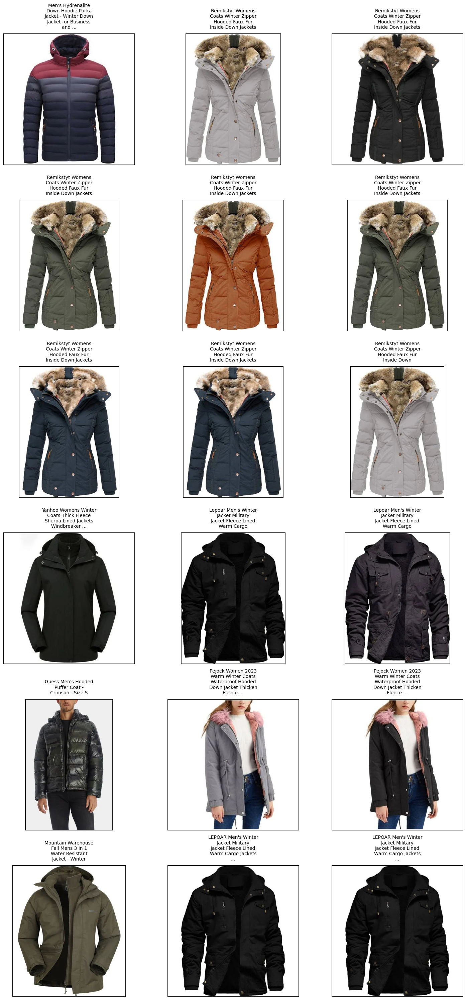

In [622]:
import os
import math
import textwrap
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches

# Assuming QueryResponse and ScoredPoint are defined elsewhere
# from your_module import QueryResponse, ScoredPoint

def display_images(search_results):
    num_images = len(search_results)
    cols = 3  # Number of columns in the grid
    rows = math.ceil(num_images / cols)  # Calculate the number of rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten()  # Flatten the 2D array of axes to 1D for easy iteration

    for i, result in enumerate(search_results):
        img_id = result.id
        title = result.payload.get('title', 'No Title')
        img_path = f"./src/images_wfash/{img_id}.webp"

        if os.path.exists(img_path):
            image = Image.open(img_path).convert("RGB")
            axes[i].imshow(image)
            
            # Wrap the title to avoid overlap
            wrapped_title = "\n".join(textwrap.wrap(title, width=20))
            axes[i].set_title(wrapped_title, pad=10, fontsize=10, ha='center')
            axes[i].axis('off')

            # Add a black border around the image and title
            rect = patches.Rectangle((0, 0), 1, 1, transform=axes[i].transAxes,
                                     linewidth=2, edgecolor='black', facecolor='none')
            axes[i].add_patch(rect)
        else:
            print(f"Image {img_path} not found.")
            axes[i].axis('off')  # Hide the axis if the image is not found

    # Hide any remaining empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Display the images and titles
display_images(search_results.points)

In [198]:
sorted_df = pd.read_csv('combined_sorted.csv')

In [199]:
import pandas as pd

# Assuming sorted_df is already defined

# Step 1: Count the occurrences of each query
query_counts = sorted_df['query'].value_counts().reset_index()
query_counts.columns = ['query', 'query_count']

# Step 2: Merge the counts back to the original DataFrame
sorted_df = sorted_df.merge(query_counts, on='query')

# Step 3: Extract the unique queries along with their query_id and query_count
unique_queries_df = sorted_df[['query_id', 'query', 'query_count']].drop_duplicates()

# Step 4: Save the unique queries to a new CSV file
unique_queries_df.to_csv('unique_queries.csv', index=False)

In [201]:
import pandas as pd
import torch
from tqdm import tqdm
from open_clip import tokenizer, tokenize

# Initialize an empty list to store the results
results = []

# Initialize query_id and count
count = 0

# Iterate over each query in the unique queries DataFrame
for index, row in tqdm(unique_queries_df.iterrows(), total=unique_queries_df.shape[0], desc="Processing Queries"):
    title = [row['query']]
    inputs = tokenizer.tokenize(title).to(device)
    
    with torch.no_grad():
        query = model.encode_text(inputs).float()  # Keep the tensor on the GPU

    search_results = qdrant_client.query_points(
        collection_name="titles_collection",
        query=[query[0], query[0]],  # Assuming qdrant_client can handle GPU tensors
        limit=row['query_count'],
    )

    # Parse the search results
    for position, result in enumerate(search_results.points, start=1):
        results.append({
            "query": row['query'],
            "product_id": result.id,
            "position": position,
            "score_reciprocal": 101-position,
            "title": result.payload["title"],
            "score": result.score,
            "query_id": row['query_id'],
            "query_count": row['query_count'],
        })

    # Increment query_id and reset count for the next unique query
    count = 0

# Convert the results list to a DataFrame
results_df = pd.DataFrame(results, columns=["query", "product_id", "position", "title", "score", "query_id", "query_count", "score_reciprocal"])

# Save the results to a new CSV file
results_df.to_csv('search_results.csv', index=False)

Processing Queries: 100%|██████████| 15012/15012 [12:03<00:00, 20.76it/s]


In [202]:
import numpy as np
from tqdm import tqdm

def dcg_at_k(r, k):
    r = np.asfarray(r)[:k]
    if r.size:
        return np.sum(r / np.log2(np.arange(2, r.size + 2)))
    return 0.

def ndcg_at_k(r, k):
    dcg_max = dcg_at_k(sorted(r, reverse=True), k)
    if not dcg_max:
        return 0.
    return dcg_at_k(r, k) / dcg_max

def calculate_ndcg(sorted_df, results_df):
    queries = sorted_df['query_id'].unique()
    ndcg_scores = []

    for query in tqdm(queries, desc="Calculating nDCG", unit="query"):
        ideal_ranking = sorted_df[sorted_df['query_id'] == query].sort_values('position')['product_id'].tolist()
        predicted_ranking = results_df[results_df['query_id'] == query].sort_values('position')['product_id'].tolist()
        
        # Create relevance scores
        ideal_relevance = [1 if product in predicted_ranking else 0 for product in ideal_ranking]
        predicted_relevance = [1 if product in ideal_ranking else 0 for product in predicted_ranking]
        
        # Calculate nDCG
        k = len(ideal_ranking)
        ndcg = ndcg_at_k(predicted_relevance, k)
        ndcg_scores.append(ndcg)
    
    # Compute average nDCG
    average_ndcg = np.mean(ndcg_scores)
    return average_ndcg

# Example usage (ensure sorted_df and results_df are defined)
average_ndcg = calculate_ndcg(sorted_df, results_df)
print(f'Average nDCG: {average_ndcg}')

Calculating nDCG: 100%|██████████| 15012/15012 [00:43<00:00, 341.30query/s]

Average nDCG: 0.7826030555055751


In [413]:
import os
import csv

# Define the path to search for .webp files
path = './products'

# Open a CSV file to store the names of the .webp files
with open('webp_files.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    # Write the header
    writer.writerow(['File Name'])
    
    # Walk through the directory
    for root, dirs, files in os.walk(path):
        for file in files:
            if file.endswith('.webp'):
                # Write the file name to the CSV
                writer.writerow([file])

In [415]:
webp_files = pd.read_csv("webp_files.csv")

In [422]:
import pandas as pd
import numpy as np

# Load the webp_files.csv into a DataFrame
webp_files_df = pd.read_csv('webp_files.csv')

# Assuming sorted_df is already loaded or defined elsewhere
# sorted_df = pd.read_csv('sorted_df.csv') # Example if needed

# Generate unique IDs, ensuring no duplicates with sorted_df["id"]
# Ensure max_id is an integer
max_id = int(max(sorted_df["id"].max(), webp_files_df.index.max())) + 1
ids = set(range(max_id, max_id + len(webp_files_df))) - set(sorted_df["id"].astype(int))

# Assign unique IDs to the webp_files_df
webp_files_df['id'] = np.array(list(ids))[:len(webp_files_df)]

In [425]:
webp_files_df["id"]

0     18446738192729369784
1     18446738192729369785
2     18446738192729369786
3     18446738192729369787
4     18446738192729369788
              ...         
88    18446738192729369872
89    18446738192729369873
90    18446738192729369874
91    18446738192729369875
92    18446738192729369876
Name: id, Length: 93, dtype: uint64

In [ ]:
"./products"

In [ ]:
"./products"

In [ ]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms

images = []
# Load images from the specified path
images = []
for img_id in df['id']:
    img_path = f"./src/images_wfash/{img_id}.webp"
    if os.path.exists(img_path):
        image = Image.open(img_path).convert("RGB")  # Load image and convert to RGB
        image = preprocess(image)  # Apply preprocessing
        images.append(image)
    else:
        print(f"Image {img_path} not found.")

image_input = torch.stack(images).to(device)  # Move to GPU if needed

# Step 3: Tokenize and embed titles
titles = df['title'].tolist()
inputs = tokenizer.tokenize(titles).to(device)
with torch.no_grad():
    image_embeddings = model.encode_image(image_input).float()
    text_embeddings = model.encode_text(inputs).float()
    # image_embeddings /= image_embeddings.norm(dim=-1, keepdim=True)
    # text_embeddings /= text_embeddings.norm(dim=-1, keepdim=True)
    



In [427]:
webp_files_df

,File Name,id
0,1pc 2024 Paris Olympics Mascot Commemorative K...,18446738192729369784
1,2020 Japan Tokyo Olympics Mascot Plush Toys Mi...,18446738192729369785
2,2020 Tokyo Olympic Paralympic Miraitowa Someit...,18446738192729369786
3,2024 France Paris The 33rd Olympics Mascot Plu...,18446738192729369787
4,2024 Paris Olympic Games Frigge Mascot Souveni...,18446738192729369788
...,...,...
88,Vinyl Lp Taylor Swift - Folklore (Deluxe Color...,18446738192729369872
89,Yamaguchi Deadpool Deadpool SHF Revoltech Dead...,18446738192729369873
90,[ Genuine ] 2020 Tokyo Olympics official masco...,18446738192729369874
91,[Cd Import] Taylor Swift - Folklore [Deluxe Ph...,18446738192729369875


In [433]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
import glob
from open_clip import tokenizer

# Assuming preprocess, tokenizer, and model are defined elsewhere
# Assuming device is defined (e.g., device = torch.device("cuda" if torch.cuda.is_available() else "cpu"))

images = []
titles = []
# Load all .webp files from the specified path
for img_path in glob.glob("./products/*.webp"):
    image = Image.open(img_path).convert("RGB")  # Load image and convert to RGB
    image = preprocess(image)  # Apply preprocessing
    images.append(image)
    title = os.path.basename(img_path).split('.')[0]  # Extract file name without extension as title
    titles.append(title)

# Convert images to a tensor and move to the appropriate device
image_input = torch.stack(images).to(device)

# Tokenize and embed titles
inputs = tokenizer.tokenize(titles).to(device)
with torch.no_grad():
    image_embeddings = model.encode_image(image_input).float()
    text_embeddings = model.encode_text(inputs).float()

In [438]:
qdrant_client = QdrantClient(host="localhost", port=6333)


In [440]:
webp_files_df

,File Name,id
0,1pc 2024 Paris Olympics Mascot Commemorative K...,18446738192729369784
1,2020 Japan Tokyo Olympics Mascot Plush Toys Mi...,18446738192729369785
2,2020 Tokyo Olympic Paralympic Miraitowa Someit...,18446738192729369786
3,2024 France Paris The 33rd Olympics Mascot Plu...,18446738192729369787
4,2024 Paris Olympic Games Frigge Mascot Souveni...,18446738192729369788
...,...,...
88,Vinyl Lp Taylor Swift - Folklore (Deluxe Color...,18446738192729369872
89,Yamaguchi Deadpool Deadpool SHF Revoltech Dead...,18446738192729369873
90,[ Genuine ] 2020 Tokyo Olympics official masco...,18446738192729369874
91,[Cd Import] Taylor Swift - Folklore [Deluxe Ph...,18446738192729369875


In [442]:
points = [
    qdrant_models.PointStruct(
        id=row['id'],
        vector=[image_embedding.tolist(), text_embedding.tolist()],
        payload={'title': row['File Name']}
    )
    for row, image_embedding, text_embedding in zip(webp_files_df.to_dict(orient='records'), image_embeddings, text_embeddings)
]
# Upload points to Qdrant
qdrant_client.upsert(
    collection_name="titles_collection",
    points=points,
)


UpdateResult(operation_id=1032532, status=<UpdateStatus.COMPLETED: 'completed'>)

In [437]:
points = [
    qdrant_models.PointStruct(
        id=row['id'],
        vector=[image_embedding.tolist(), text_embedding.tolist()],
        payload={'title': row['title']}
    )
    for row, image_embedding, text_embedding in zip(df.to_dict(orient='records'), image_embeddings, text_embeddings)
]

# Upload points to Qdrant
qdrant_client.upsert(
    collection_name="titles_collection",
    points=points,
)

['1pc 2024 Paris Olympics Mascot Commemorative Keychain Pendant ',
 '2020 Japan Tokyo Olympics Mascot Plush Toys Miraitow Doll Olympic Memorial Dollblue,28cm Mailebao 2020 Japan Tokyo Olympics Mascot Plush Toys Miraitow Doll Olympic Memorial',
 '2020 Tokyo Olympic Paralympic Miraitowa Someity Mascot Set Plush',
 '2024 France Paris The 33rd Olympics Mascot Plush Toy Souvenir',
 '2024 Paris Olympic Games Frigge Mascot Souvenir Gift In Stock',
 '2024 Paris Olympic Mascot Pin B',
 '2024 Paris Olympics Mascot (phryges) Commemorative',
 '2024 Paris Olympics Mascot Figurines, Eiffel Tower Olympic Souvenirs',
 '2024 Paris Olympics-Mascot Phryges, plush toy,no box',
 '8in Marvel X-men Deadpool Ultimate Collector_s Action Figure Model',
 'Action Figure Deadpool Marvel Premier Collection Resin Statue',
 'Action Figure Deadpool Number 01 Merc With A Mouth',
 'action figure Deadpool wolverine venompool galactus G0172 G0173',
 'Action Figure Revoltech Deadpool Action Figure Amazing Yamaguchi',
 'Act

In [454]:
import pandas as pd
import os

# Assuming webp_files_df is already loaded with columns ['original_name', 'new_id']
target_directory = "./products"

for index, row in webp_files_df.iterrows():
    original_file_name = row['File Name']
    new_id = row['id']
    old_path = os.path.join(target_directory, original_file_name)
    new_file_name = f"{new_id}.webp"
    new_path = os.path.join(target_directory, new_file_name)
    
    try:
        os.rename(old_path, new_path)
        print(f"Renamed {original_file_name} to {new_file_name}")
    except FileNotFoundError:
        print(f"File {original_file_name} not found.")
    except PermissionError:
        print(f"Permission denied while renaming {original_file_name} to {new_file_name}.")

Renamed 1pc 2024 Paris Olympics Mascot Commemorative Keychain Pendant .webp to 18446738192729369784.webp
Renamed 2020 Japan Tokyo Olympics Mascot Plush Toys Miraitow Doll Olympic Memorial Dollblue,28cm Mailebao 2020 Japan Tokyo Olympics Mascot Plush Toys Miraitow Doll Olympic Memorial.webp to 18446738192729369785.webp
Renamed 2020 Tokyo Olympic Paralympic Miraitowa Someity Mascot Set Plush.webp to 18446738192729369786.webp
Renamed 2024 France Paris The 33rd Olympics Mascot Plush Toy Souvenir.webp to 18446738192729369787.webp
Renamed 2024 Paris Olympic Games Frigge Mascot Souvenir Gift In Stock.webp to 18446738192729369788.webp
Renamed 2024 Paris Olympic Mascot Pin B.webp to 18446738192729369789.webp
Renamed 2024 Paris Olympics Mascot (phryges) Commemorative.webp to 18446738192729369790.webp
Renamed 2024 Paris Olympics Mascot Figurines, Eiffel Tower Olympic Souvenirs.webp to 18446738192729369791.webp
Renamed 2024 Paris Olympics-Mascot Phryges, plush toy,no box.webp to 184467381927293697